# Segment Anything Model

## インポート

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import requests
import torch
from PIL import Image
from transformers import SamModel, SamProcessor

## 画像の読み込み

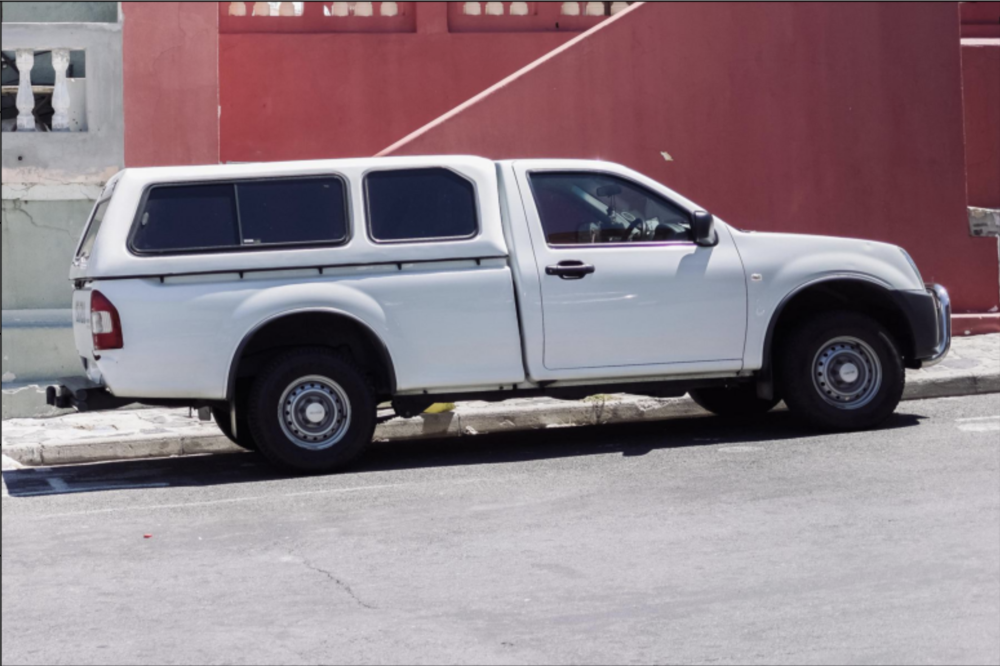

In [ ]:
img_url = "https://huggingface.co/ybelkada/segment-anything/resolve/main/assets/car.png"
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert("RGB")
raw_image

## 表示用のユーティリティ関数を定義

In [ ]:
def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


def show_boxes_on_image(raw_image, boxes):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()


def show_points_on_image(raw_image, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    plt.axis('on')
    plt.show()


def show_points_and_boxes_on_image(raw_image, boxes, input_points, input_labels=None):
    plt.figure(figsize=(10,10))
    plt.imshow(raw_image)
    input_points = np.array(input_points)
    if input_labels is None:
      labels = np.ones_like(input_points[:, 0])
    else:
      labels = np.array(input_labels)
    show_points(input_points, labels, plt.gca())
    for box in boxes:
      show_box(box, plt.gca())
    plt.axis('on')
    plt.show()


def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_masks_on_image(raw_image, masks, scores):
    if len(masks.shape) == 4:
      masks = masks.squeeze()
    if scores.shape[0] == 1:
      scores = scores.squeeze()

    nb_predictions = scores.shape[-1]
    fig, axes = plt.subplots(1, nb_predictions, figsize=(30, 30))

    for i, (mask, score) in enumerate(zip(masks, scores)):
      mask = mask.cpu().detach().numpy()
      axes[i].imshow(np.array(raw_image))
      show_mask(mask, axes[i])
      axes[i].title.set_text(f"Mask {i+1}, Score: {score.item():.3f}")
      axes[i].axis("off")
    plt.show()

## マスクの予測

### 単一の点

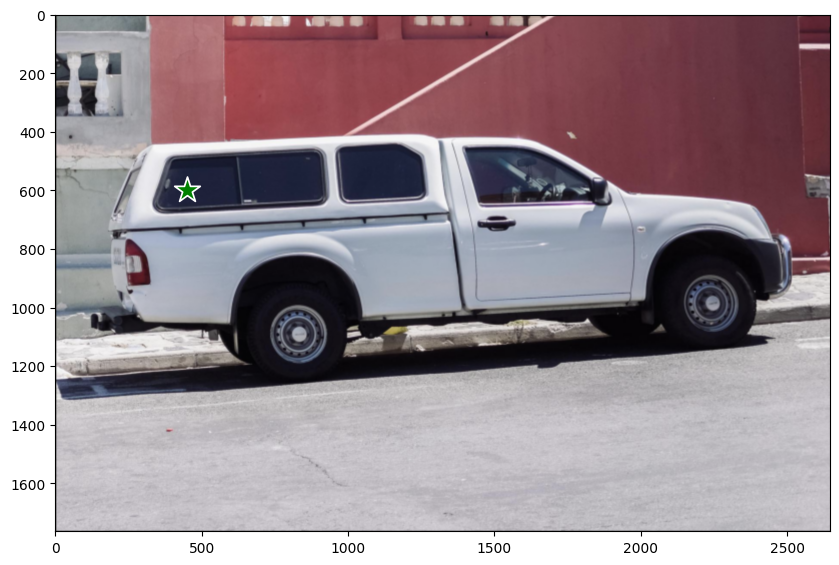

In [ ]:
input_points = [[[450, 600]]]
input_labels = [[1]]
show_points_on_image(raw_image, input_points[0], input_labels[0])

In [ ]:
model_name_or_path = "facebook/sam-vit-huge"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SamModel.from_pretrained(model_name_or_path).to(device)
processor = SamProcessor.from_pretrained(model_name_or_path)

inputs = processor(
    images=raw_image,
    input_points=input_points,
    input_labels=input_labels,
    return_tensors="pt",
).to(device)

with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    masks=outputs.pred_masks.cpu(),
    original_sizes=inputs["original_sizes"].cpu(),
    reshaped_input_sizes=inputs["reshaped_input_sizes"].cpu(),
)[0]
scores = outputs.iou_scores[0]

Loading weights:   0%|          | 0/594 [00:00<?, ?it/s]

In [ ]:
scores.shape

torch.Size([1, 3])

In [ ]:
masks.shape

torch.Size([1, 3, 1764, 2646])

In [ ]:
scores

tensor([[0.9910, 0.9818, 0.9667]], device='cuda:0')

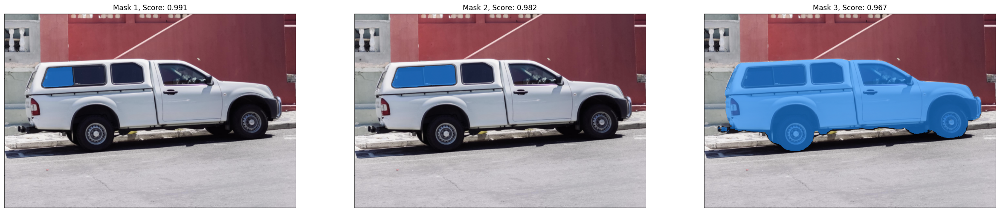

In [ ]:
show_masks_on_image(raw_image, masks, scores)

### 複数の点

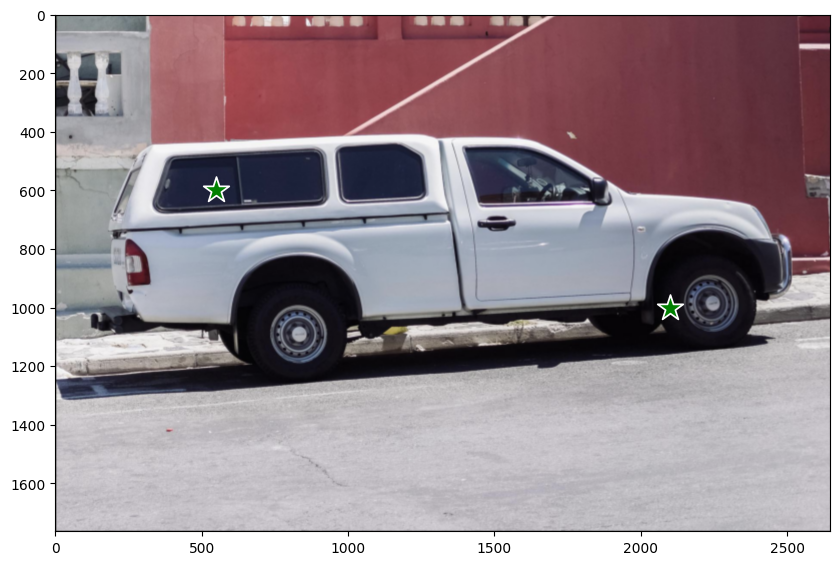

In [ ]:
input_points = [[[550, 600], [2100, 1000]]]
input_labels = [[1, 1]]
show_points_on_image(raw_image, input_points[0], input_labels[0])

In [ ]:
inputs = processor(
    images=raw_image,
    input_points=input_points,
    input_labels=input_labels,
    return_tensors="pt",
).to(device)

with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    masks=outputs.pred_masks.cpu(),
    original_sizes=inputs["original_sizes"].cpu(),
    reshaped_input_sizes=inputs["reshaped_input_sizes"].cpu(),
)[0]
scores = outputs.iou_scores[0]

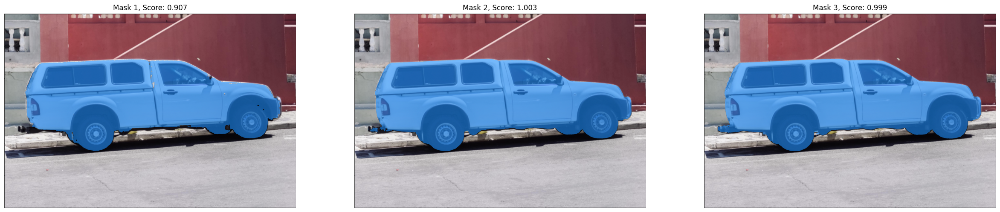

In [ ]:
show_masks_on_image(raw_image, masks, scores)

### バウンディングボックス

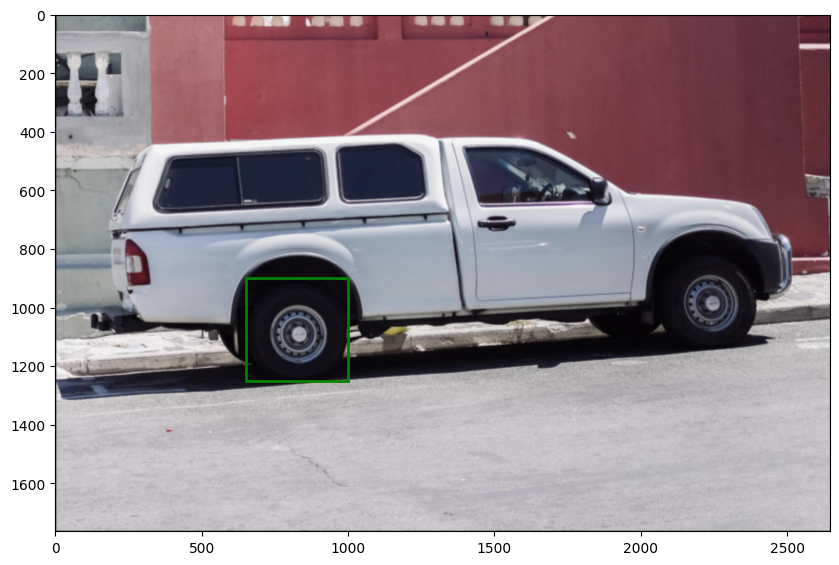

In [ ]:
input_boxes = [[[650, 900, 1000, 1250]]]
show_boxes_on_image(raw_image, input_boxes[0])

In [ ]:
inputs = processor(
    images=raw_image,
    input_boxes=input_boxes,
    return_tensors="pt",
).to(device)

with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    masks=outputs.pred_masks.cpu(),
    original_sizes=inputs["original_sizes"].cpu(),
    reshaped_input_sizes=inputs["reshaped_input_sizes"].cpu(),
)[0]
scores = outputs.iou_scores[0]

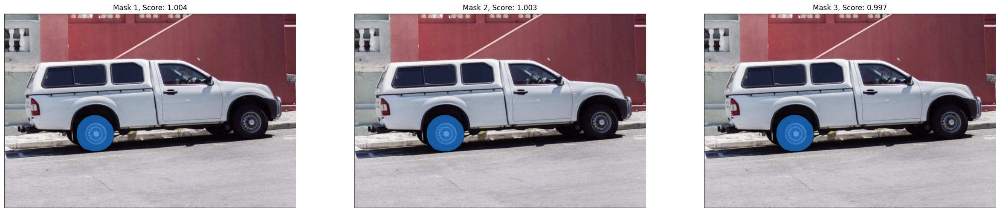

In [ ]:
show_masks_on_image(raw_image, masks, scores)

### 点とバウンディングボックス

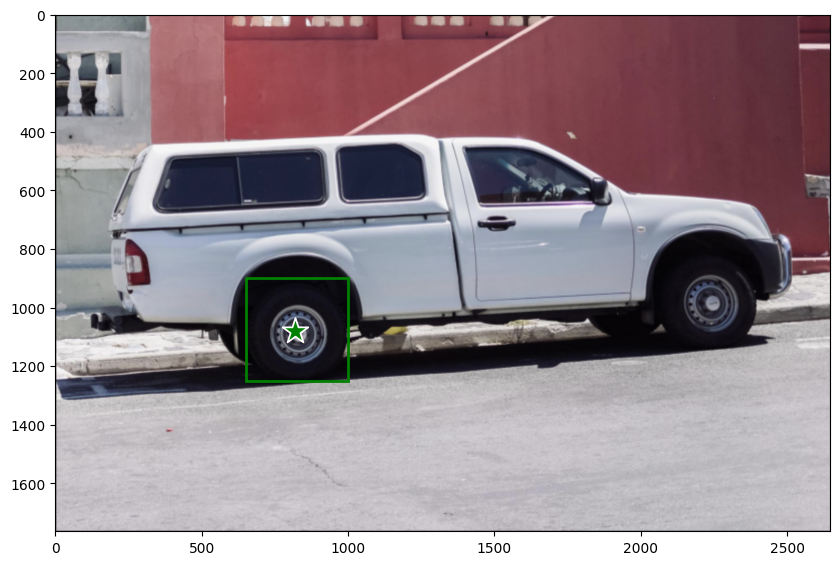

In [ ]:
input_boxes = [[[650, 900, 1000, 1250]]]
input_points = [[[820, 1080]]]

show_points_and_boxes_on_image(raw_image, input_boxes[0], input_points[0])

In [ ]:
inputs = processor(
    images=raw_image,
    input_points=input_points,
    input_boxes=input_boxes,
    return_tensors="pt",
).to(device)

with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    masks=outputs.pred_masks.cpu(),
    original_sizes=inputs["original_sizes"].cpu(),
    reshaped_input_sizes=inputs["reshaped_input_sizes"].cpu(),
)[0]
scores = outputs.iou_scores[0]

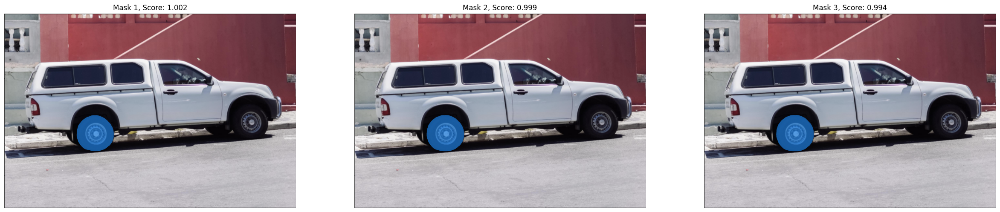

In [ ]:
show_masks_on_image(raw_image, masks, scores)

### 背景点

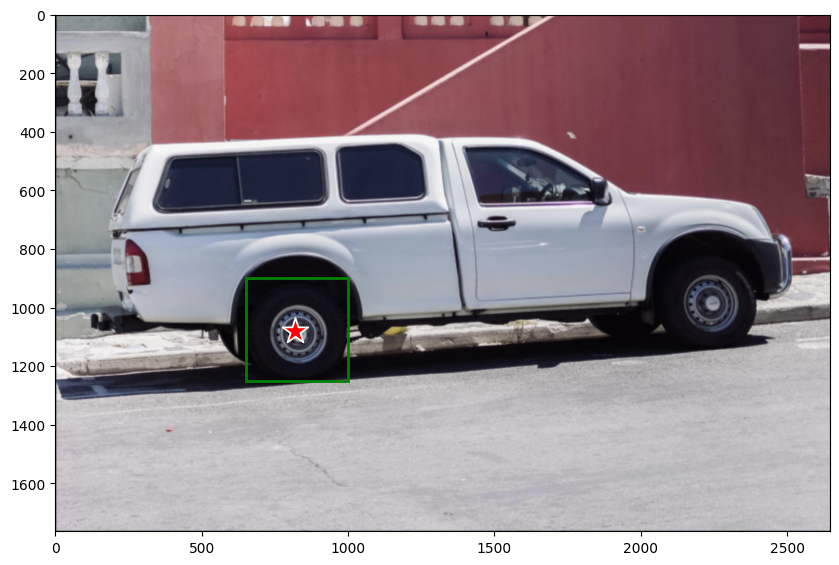

In [ ]:
input_boxes = [[[650, 900, 1000, 1250]]]
input_points = [[[820, 1080]]]
labels = [[0]]

show_points_and_boxes_on_image(raw_image, input_boxes[0], input_points[0], labels[0])

In [ ]:
inputs = processor(
    images=raw_image,
    input_points=input_points,
    input_boxes=input_boxes,
    input_labels=labels,
    return_tensors="pt",
).to(device)

with torch.no_grad():
    outputs = model(**inputs)

masks = processor.image_processor.post_process_masks(
    masks=outputs.pred_masks.cpu(),
    original_sizes=inputs["original_sizes"].cpu(),
    reshaped_input_sizes=inputs["reshaped_input_sizes"].cpu(),
)[0]
scores = outputs.iou_scores[0]

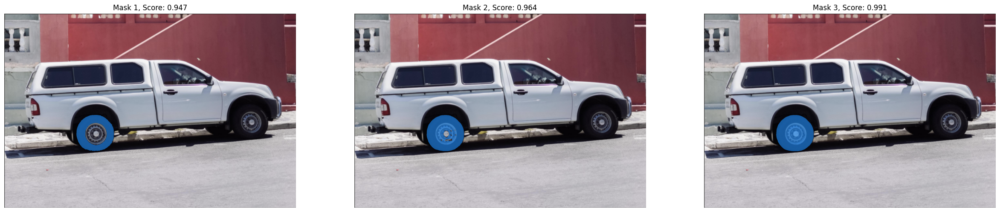

In [ ]:
show_masks_on_image(raw_image, masks, scores)

## 参考資料

- [SAM | Hugging Face](https://huggingface.co/docs/transformers/en/model_doc/sam)
- [Segment Anything](https://ar5iv.labs.arxiv.org/html/2304.02643)